In [1]:
import pandas as pd
df = pd.read_csv('jewelry.csv').dropna()
df

,Orderdatetime,Order ID,Purchased product ID,Quantity of SKU in the order,Category ID,Categoryalias,BrandID,PriceinUSD,User ID,Product gender (for male/female),Unnamed: 10,Unnamed: 11,jewelrykind
2,2018-12-02 13:53:42 UTC,1925511016616034733,1842214461889315556,1,1.806829e+18,jewelry.pendant,1.0,54.66,1.515916e+18,f,white,gold,sapphire
3,2018-12-02 17:44:02 UTC,1925626951238681511,1835566849434059453,1,1.806829e+18,jewelry.pendant,0.0,88.90,1.515916e+18,f,red,gold,diamond
8,2018-12-03 07:03:49 UTC,1926029494397698277,1811798112444875309,1,1.806829e+18,jewelry.pendant,2.0,60.27,1.515916e+18,f,red,gold,pearl
19,2018-12-04 19:55:22 UTC,1927142607515812568,1807570270689427678,1,1.806829e+18,jewelry.earring,1.0,102.60,1.515916e+18,f,yellow,gold,garnet
20,2018-12-04 20:10:22 UTC,1927150150686343971,1806829191581138983,1,1.806829e+18,jewelry.pendant,1.0,61.51,1.515916e+18,f,yellow,gold,garnet
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95888,2021-12-01 08:56:09 UTC,2718990685846896923,1956663831174316886,1,1.806829e+18,jewelry.ring,2.0,527.26,1.515916e+18,f,red,gold,diamond
95889,2021-12-01 08:57:17 UTC,2718991258755268929,1526046687884214821,1,1.806829e+18,jewelry.earring,1.0,1308.08,1.515916e+18,f,red,gold,topaz
95897,2021-12-01 09:15:46 UTC,2719000558995243804,1956663848136082144,1,1.806829e+18,jewelry.pendant,1.0,91.64,1.515916e+18,f,red,gold,fianit
95900,2021-12-01 09:23:52 UTC,2719004635036648408,1806829194332602450,1,1.806829e+18,jewelry.earring,1.0,821.78,1.515916e+18,f,red,gold,diamond


In [2]:
def show_group(df,keyword):
    # 各クラスタのインデックスのリストを保持するための辞書
    cluster_indices = {}

    # label列のユニークな値（クラスタのラベル）を走査する
    for label in df[keyword].unique():
        # 特定のクラスタに属する行のインデックスを取得し、リストとして保持
        cluster_indices[label] = df[df[keyword] == label].index.tolist()

    # 各クラスタのインデックスを表示
    for label, indices in cluster_indices.items():
        print(f"Cluster {label}:")
        print(indices)

In [3]:
import pandas as pd
  
df2 = pd.read_csv('jewelry.csv',usecols=['Orderdatetime', 'PriceinUSD','BrandID','jewelrykind','Categoryalias']).dropna()
print(df2)

                 Orderdatetime     Categoryalias  BrandID  PriceinUSD  \
0      2018-12-01 11:40:29 UTC   jewelry.earring      0.0      561.51   
2      2018-12-02 13:53:42 UTC   jewelry.pendant      1.0       54.66   
3      2018-12-02 17:44:02 UTC   jewelry.pendant      0.0       88.90   
4      2018-12-02 21:30:19 UTC  jewelry.necklace      0.0      417.67   
6      2018-12-02 22:09:34 UTC   jewelry.earring      0.0      150.55   
...                        ...               ...      ...         ...   
95897  2021-12-01 09:15:46 UTC   jewelry.pendant      1.0       91.64   
95900  2021-12-01 09:23:52 UTC   jewelry.earring      1.0      821.78   
95904  2021-12-01 09:37:28 UTC   jewelry.earring      0.0      301.23   
95908  2021-12-01 09:52:06 UTC   jewelry.earring      1.0      630.00   
95909  2021-12-01 09:55:35 UTC   jewelry.earring      0.0       83.42   

      jewelrykind  
0         diamond  
2        sapphire  
3         diamond  
4        amethyst  
6         diamond  
...

In [4]:
from sklearn import preprocessing
time_idx="Orderdatetime" 
freq="H"
df2[time_idx]=df2[time_idx].str.replace("UTC","")
df2

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
0,2018-12-01 11:40:29,jewelry.earring,0.0,561.51,diamond
2,2018-12-02 13:53:42,jewelry.pendant,1.0,54.66,sapphire
3,2018-12-02 17:44:02,jewelry.pendant,0.0,88.90,diamond
4,2018-12-02 21:30:19,jewelry.necklace,0.0,417.67,amethyst
6,2018-12-02 22:09:34,jewelry.earring,0.0,150.55,diamond
...,...,...,...,...,...
95897,2021-12-01 09:15:46,jewelry.pendant,1.0,91.64,fianit
95900,2021-12-01 09:23:52,jewelry.earring,1.0,821.78,diamond
95904,2021-12-01 09:37:28,jewelry.earring,0.0,301.23,amethyst
95908,2021-12-01 09:52:06,jewelry.earring,1.0,630.00,diamond


In [5]:
type(df[time_idx])

pandas.core.series.Series

In [6]:
from sklearn import preprocessing
time_idx="Orderdatetime" 
freq="H"
df2[time_idx] = pd.to_datetime(df2[time_idx])
df2[time_idx] = df2[time_idx].round(freq)
df2

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
0,2018-12-01 12:00:00,jewelry.earring,0.0,561.51,diamond
2,2018-12-02 14:00:00,jewelry.pendant,1.0,54.66,sapphire
3,2018-12-02 18:00:00,jewelry.pendant,0.0,88.90,diamond
4,2018-12-02 22:00:00,jewelry.necklace,0.0,417.67,amethyst
6,2018-12-02 22:00:00,jewelry.earring,0.0,150.55,diamond
...,...,...,...,...,...
95897,2021-12-01 09:00:00,jewelry.pendant,1.0,91.64,fianit
95900,2021-12-01 09:00:00,jewelry.earring,1.0,821.78,diamond
95904,2021-12-01 10:00:00,jewelry.earring,0.0,301.23,amethyst
95908,2021-12-01 10:00:00,jewelry.earring,1.0,630.00,diamond


In [7]:
df2 = df2.sort_values(time_idx)
start = df2[time_idx].min()
end = df2[time_idx].max()
ticks = pd.date_range(start, end, freq=freq)
timepoint_encoder = preprocessing.LabelEncoder()
timepoint_encoder.fit(ticks)
df2[time_idx] = timepoint_encoder.transform(df2[time_idx].values)

df2

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
0,0,jewelry.earring,0.0,561.51,diamond
2,26,jewelry.pendant,1.0,54.66,sapphire
3,30,jewelry.pendant,0.0,88.90,diamond
4,34,jewelry.necklace,0.0,417.67,amethyst
6,34,jewelry.earring,0.0,150.55,diamond
...,...,...,...,...,...
95879,26301,jewelry.earring,0.0,424.52,diamond
95900,26301,jewelry.earring,1.0,821.78,diamond
95908,26302,jewelry.earring,1.0,630.00,diamond
95904,26302,jewelry.earring,0.0,301.23,amethyst


In [8]:
# Encode categorical features
categorical_idxs="Categoryalias/BrandID/jewelrykind"
categorical_idxs = categorical_idxs.split("/")
oe = preprocessing.OrdinalEncoder()
df2[categorical_idxs] = oe.fit_transform(df2[categorical_idxs])
df2[categorical_idxs] = df2[categorical_idxs].astype(int)
# カテゴリごとのエンコード結果を表示
for i, column in enumerate(categorical_idxs):
    print(f'Column: {column}') 
    for category, encoded in zip(oe.categories_[i], range(len(oe.categories_[i]))):
        print(f'{category} -> {encoded}')
df2

Column: Categoryalias
electronics.clocks -> 0
jewelry.bracelet -> 1
jewelry.brooch -> 2
jewelry.earring -> 3
jewelry.necklace -> 4
jewelry.pendant -> 5
jewelry.ring -> 6
jewelry.souvenir -> 7
Column: BrandID
0.0 -> 0
1.0 -> 1
2.0 -> 2
3.0 -> 3
4.0 -> 4
5.0 -> 5
6.0 -> 6
Column: jewelrykind
agate -> 0
amber -> 1
amethyst -> 2
chrysolite -> 3
chrysoprase -> 4
citrine -> 5
coral -> 6
corundum_synthetic -> 7
diamond -> 8
emerald -> 9
emerald_geothermal -> 10
fianit -> 11
garnet -> 12
garnet_synthetic -> 13
mix -> 14
nacre -> 15
nanocrystal -> 16
onyx -> 17
pearl -> 18
quartz -> 19
quartz_smoky -> 20
rhodolite -> 21
ruby -> 22
sapphire -> 23
sapphire_geothermal -> 24
sitall -> 25
spinel -> 26
topaz -> 27
tourmaline -> 28
turquoise -> 29


,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
0,0,3,0,561.51,8
2,26,5,1,54.66,23
3,30,5,0,88.90,8
4,34,4,0,417.67,2
6,34,3,0,150.55,8
...,...,...,...,...,...
95879,26301,3,0,424.52,8
95900,26301,3,1,821.78,8
95908,26302,3,1,630.00,8
95904,26302,3,0,301.23,2


In [9]:
import numpy as np
df2['PriceinUSD'] = np.floor(df2['PriceinUSD'] / 25).astype(int)
df2

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
0,0,3,0,22,8
2,26,5,1,2,23
3,30,5,0,3,8
4,34,4,0,16,2
6,34,3,0,6,8
...,...,...,...,...,...
95879,26301,3,0,16,8
95900,26301,3,1,32,8
95908,26302,3,1,25,8
95904,26302,3,0,12,2


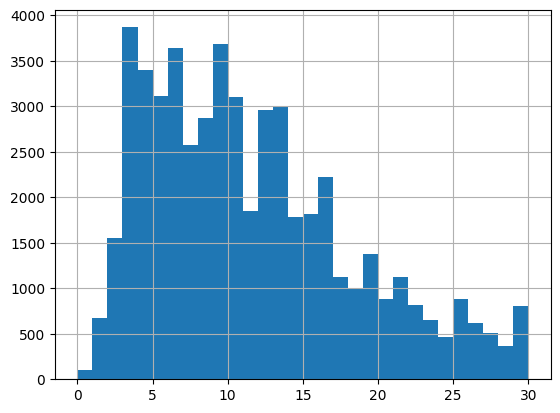

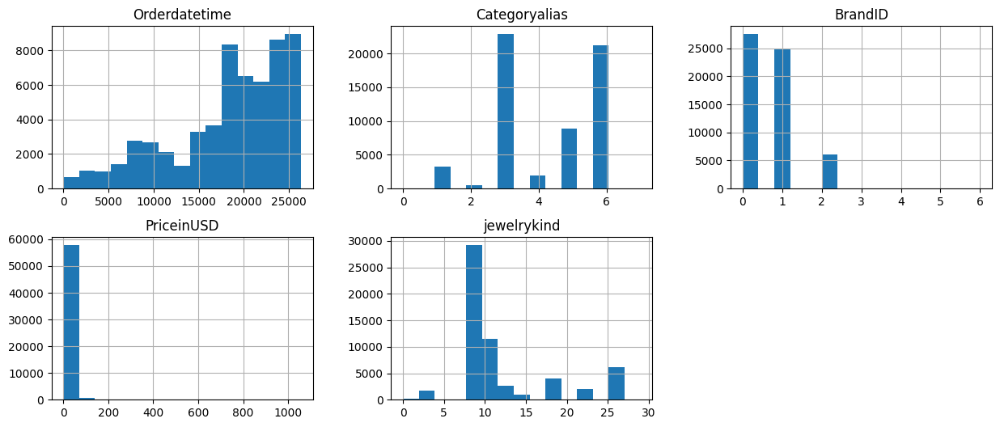

In [10]:
import matplotlib.pyplot as plt
bin_edges = [0, 1, 2, 3, 4, 5, 6, 7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30]
df2['PriceinUSD'].hist(bins=bin_edges)
df2.hist(bins=15, figsize=(15, 6), layout=(2, 3))

plt.show()

In [11]:
import plotly.express as px

fig = px.scatter_3d(df, x='jewelrykind', y='BrandID', z='PriceinUSD')
# マーカーのサイズを変更
fig.update_traces(marker=dict(size=1))
fig.show()

In [12]:
fig = px.scatter_3d(df, x='Orderdatetime', y='jewelrykind', z='PriceinUSD')
# マーカーのサイズを変更
fig.update_traces(marker=dict(size=1))
fig.show()

In [13]:
brand_df0=df2[df2['BrandID'] == 0]
brand_df1=df2[df2['BrandID'] == 1]
brand_df2=df2[df2['BrandID'] == 2]
brand_df3=df2[df2['BrandID'] == 3]
brand_df4=df2[df2['BrandID'] == 4]
brand_df5=df2[df2['BrandID'] == 5]
brand_df6=df2[df2['BrandID'] == 6]
brand_df0

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
0,0,3,0,22,8
3,30,5,0,3,8
4,34,4,0,16,2
6,34,3,0,6,8
7,34,3,0,3,11
...,...,...,...,...,...
95878,26301,3,0,22,8
95875,26301,6,0,46,8
95879,26301,3,0,16,8
95904,26302,3,0,12,2


In [14]:
order_counts = brand_df0.groupby('Orderdatetime').size().reset_index(name='Sum')

print(order_counts)

       Orderdatetime  Sum
0                  0    1
1                 30    1
2                 34    3
3                 55    1
4                 66    1
...              ...  ...
10671          26298    2
10672          26299    7
10673          26300    7
10674          26301    7
10675          26302    2

[10676 rows x 2 columns]


0
1


<Figure size 1000x600 with 0 Axes>

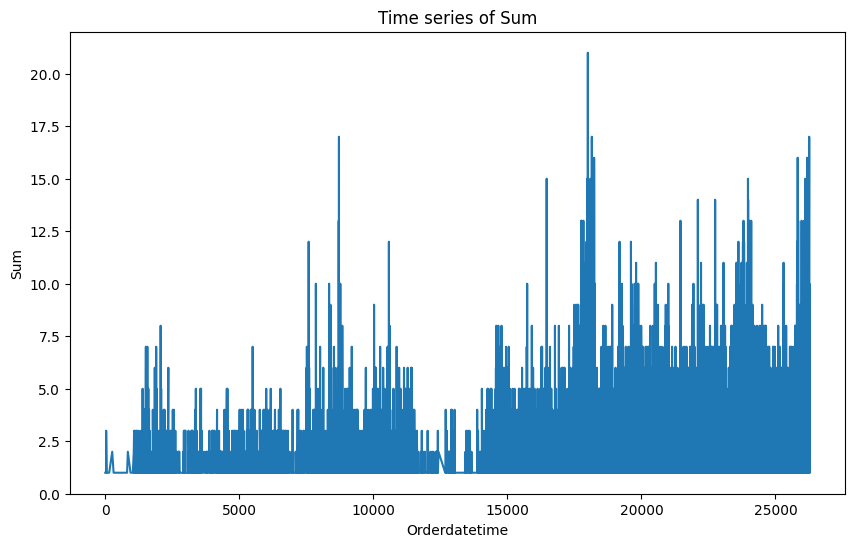

In [15]:
plt.figure(figsize=(10, 6))
print(order_counts['Orderdatetime'][0])
print(order_counts['Sum'][0])

df_filtered_0 = order_counts[order_counts['Orderdatetime'] <= 8760*3]
plt.figure(figsize=(10, 6))
plt.plot(df_filtered_0['Orderdatetime'], df_filtered_0['Sum'])
plt.xlabel('Orderdatetime')
plt.ylabel('Sum')
plt.title('Time series of Sum')
plt.show()

In [16]:
import pandas as pd

# Orderdatetimeの最大値を取得
max_orderdatetime = df_filtered_0['Orderdatetime'].max()

# Orderdatetimeが0から最大値までの全範囲のDataFrameを作成
complete_datetime_df = pd.DataFrame({'Orderdatetime': range(0, max_orderdatetime+1)})

# 上記で作成したDataFrameと元のDataFrameをマージし、欠損値を0で埋める
df_filled = pd.merge(complete_datetime_df, df_filtered_0, on='Orderdatetime', how='left').fillna(0)

print(df_filled)

       Orderdatetime  Sum
0                  0  1.0
1                  1  0.0
2                  2  0.0
3                  3  0.0
4                  4  0.0
...              ...  ...
26276          26276  6.0
26277          26277  5.0
26278          26278  6.0
26279          26279  4.0
26280          26280  5.0

[26281 rows x 2 columns]


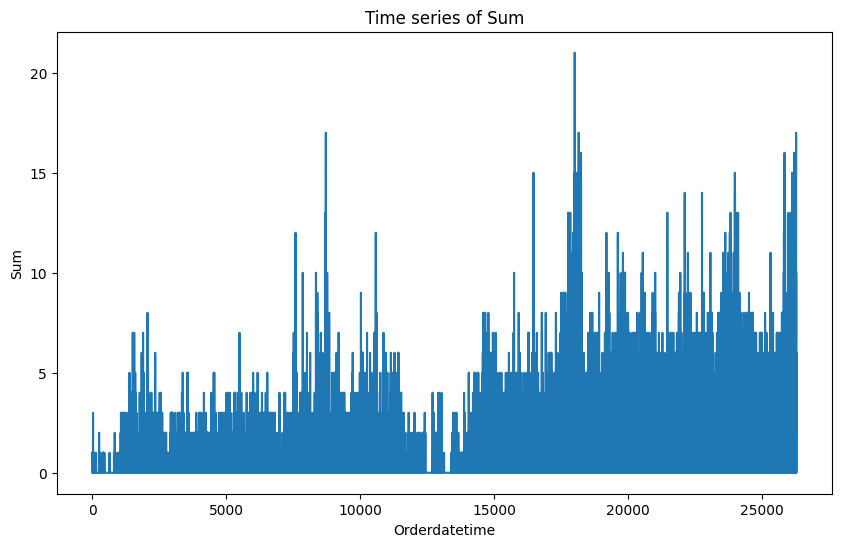

In [17]:
plt.figure(figsize=(10, 6))
plt.plot(df_filled['Orderdatetime'], df_filled['Sum'])
plt.xlabel('Orderdatetime')
plt.ylabel('Sum')
plt.title('Time series of Sum')
plt.show()

In [18]:
# "day"という名前の新しい列を作り、"Orderdatetime"を24で割った商（整数部分）を代入します
df_filled['day'] = np.floor(df_filled['Orderdatetime'] / 24).astype(int)

# "day"でデータをグループ化し、"Sum"の列の合計値を計算します
grouped_df = df_filled.groupby('day')['Sum'].sum().reset_index()

print(grouped_df)

       day    Sum
0        0    1.0
1        1    4.0
2        2    3.0
3        3    2.0
4        4    0.0
...    ...    ...
1091  1091  143.0
1092  1092  111.0
1093  1093  116.0
1094  1094  117.0
1095  1095    5.0

[1096 rows x 2 columns]


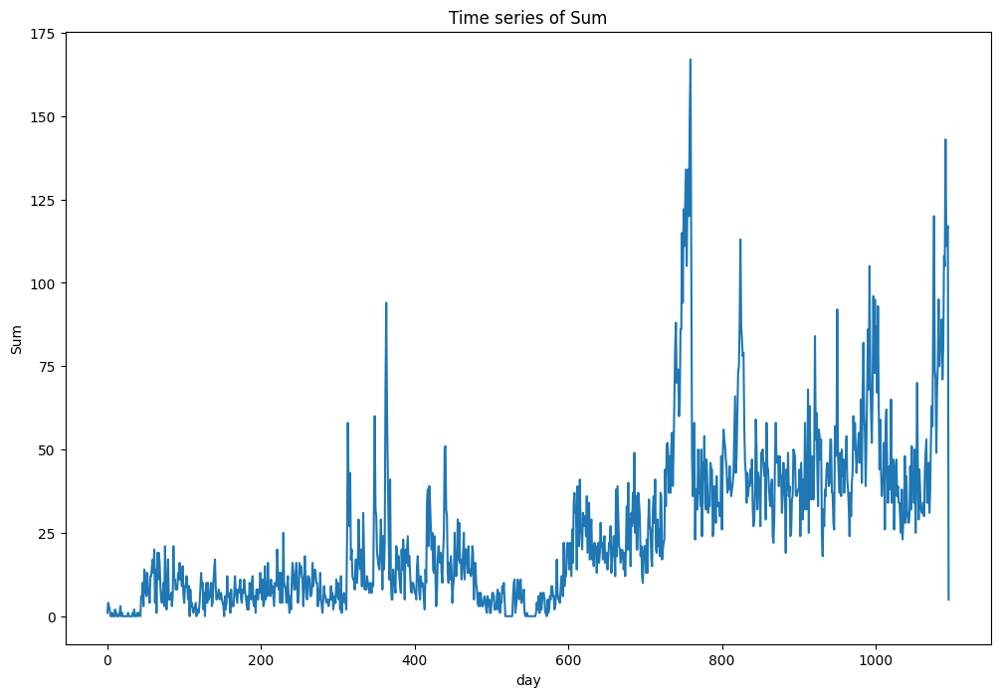

In [19]:
plt.figure(figsize=(12, 8))
plt.plot(grouped_df['day'], grouped_df['Sum'])
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum')
plt.show()

In [70]:
max_day = grouped_df[grouped_df['Sum'] >= 70]
pd.set_option('display.max_rows', 150)
#print(max_day)

max_day

,day,Sum
363,363,94.0
739,739,80.0
740,740,88.0
741,741,70.0
742,742,72.0
743,743,74.0
746,746,86.0
747,747,86.0
748,748,115.0
749,749,94.0


In [20]:
def plt_day_of_year(df):
    order_counts = df.groupby('Orderdatetime').size().reset_index(name='Sum')
    df_filtered_0 = order_counts[order_counts['Orderdatetime'] <= 8760*3]
    # Orderdatetimeの最大値を取得
    max_orderdatetime = df_filtered_0['Orderdatetime'].max()

    # Orderdatetimeが0から最大値までの全範囲のDataFrameを作成
    complete_datetime_df = pd.DataFrame({'Orderdatetime': range(0, max_orderdatetime+1)})
    #1hourで出力
    # 上記で作成したDataFrameと元のDataFrameをマージし、欠損値を0で埋める
    df_filled = pd.merge(complete_datetime_df, df_filtered_0, on='Orderdatetime', how='left').fillna(0)
    
    #1dayごとに変換
    # "day"という名前の新しい列を作り、"Orderdatetime"を24で割った商（整数部分）を代入します
    df_filled['day'] = np.floor(df_filled['Orderdatetime'] / 24).astype(int)

    # "day"でデータをグループ化し、"Sum"の列の合計値を計算します
    grouped_df = df_filled.groupby('day')['Sum'].sum().reset_index()
    return grouped_df

In [21]:
grouped_df1=plt_day_of_year(brand_df1)
grouped_df2=plt_day_of_year(brand_df2)
grouped_df3=plt_day_of_year(brand_df3)
grouped_df4=plt_day_of_year(brand_df4)
grouped_df5=plt_day_of_year(brand_df5)
grouped_df6=plt_day_of_year(brand_df6)

In [22]:
show_group(df2,"BrandID")

Cluster 0:
[0, 3, 4, 6, 7, 13, 14, 15, 18, 21, 37, 55, 53, 70, 88, 91, 94, 95, 101, 117, 125, 128, 127, 139, 145, 147, 157, 158, 164, 165, 166, 168, 175, 172, 180, 184, 186, 198, 200, 199, 201, 208, 211, 217, 218, 219, 220, 230, 231, 240, 243, 245, 246, 251, 249, 248, 259, 260, 262, 263, 267, 268, 270, 271, 278, 276, 280, 282, 283, 285, 286, 288, 294, 296, 299, 300, 302, 303, 305, 308, 316, 318, 321, 322, 331, 332, 333, 334, 341, 349, 351, 352, 353, 357, 361, 359, 362, 363, 364, 374, 377, 376, 380, 388, 389, 390, 395, 399, 402, 403, 405, 406, 413, 417, 418, 426, 432, 438, 445, 450, 451, 461, 458, 459, 472, 477, 478, 479, 481, 482, 483, 486, 489, 502, 505, 506, 509, 513, 514, 515, 519, 521, 523, 524, 525, 534, 528, 527, 530, 546, 535, 536, 538, 542, 553, 555, 561, 568, 572, 575, 577, 578, 579, 581, 582, 583, 589, 590, 591, 592, 593, 594, 598, 603, 607, 609, 611, 620, 624, 625, 628, 629, 631, 632, 641, 642, 644, 645, 650, 657, 666, 669, 670, 672, 675, 680, 686, 687, 683, 685, 689, 690, 6

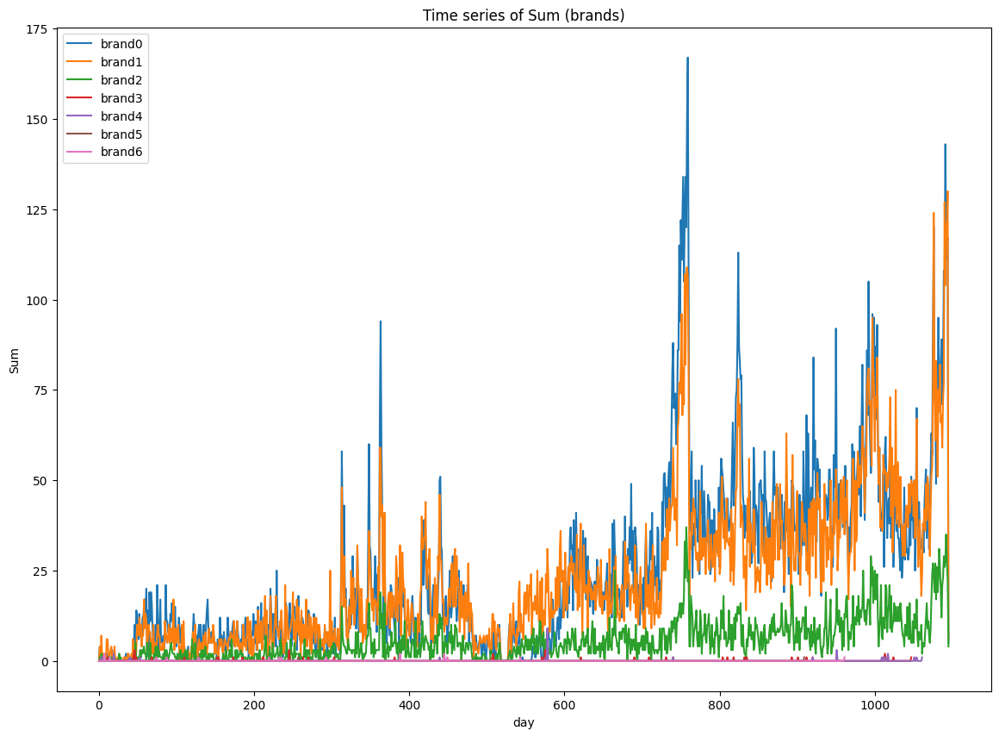

In [23]:
plt.figure(figsize=(14, 10))
plt.plot(grouped_df['day'], grouped_df['Sum'],label='brand0')
plt.plot(grouped_df1['day'], grouped_df1['Sum'],label='brand1')
plt.plot(grouped_df2['day'], grouped_df2['Sum'],label='brand2')
plt.plot(grouped_df3['day'], grouped_df3['Sum'],label='brand3')
plt.plot(grouped_df4['day'], grouped_df4['Sum'],label='brand4')
plt.plot(grouped_df5['day'], grouped_df5['Sum'],label='brand5')
plt.plot(grouped_df6['day'], grouped_df6['Sum'],label='brand6')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (brands)')
# 凡例の表示
plt.legend()
plt.show()

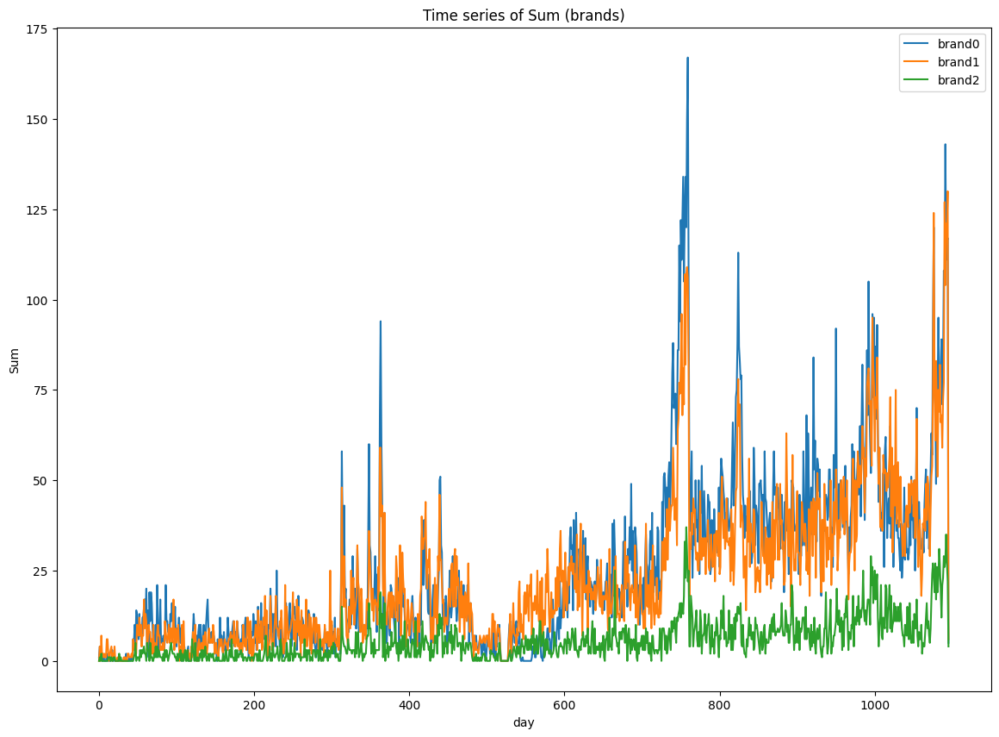

In [24]:
plt.figure(figsize=(14, 10))
plt.plot(grouped_df['day'], grouped_df['Sum'],label='brand0')
plt.plot(grouped_df1['day'], grouped_df1['Sum'],label='brand1')
plt.plot(grouped_df2['day'], grouped_df2['Sum'],label='brand2')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (brands)')
# 凡例の表示
plt.legend()
plt.show()

In [25]:
category_df0=df2[df2['Categoryalias'] == 0]
category_df1=df2[df2['Categoryalias'] == 1]
category_df2=df2[df2['Categoryalias'] == 2]
category_df3=df2[df2['Categoryalias'] == 3]
category_df4=df2[df2['Categoryalias'] == 4]
category_df5=df2[df2['Categoryalias'] == 5]
category_df6=df2[df2['Categoryalias'] == 6]
category_df6=df2[df2['Categoryalias'] == 7]
category_df0

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind
40,171,0,6,11,11
41,171,0,6,11,11
79,359,0,6,11,11
1053,1776,0,2,45,11
1052,1776,0,6,23,11
1442,2108,0,6,8,11
2324,3093,0,6,12,11
4379,5279,0,6,7,11
4827,5571,0,6,12,11
4953,5662,0,6,12,11


In [26]:
category_grouped_df0=plt_day_of_year(category_df0)
category_grouped_df1=plt_day_of_year(category_df1)
category_grouped_df2=plt_day_of_year(category_df2)
category_grouped_df3=plt_day_of_year(category_df3)
category_grouped_df4=plt_day_of_year(category_df4)
category_grouped_df5=plt_day_of_year(category_df5)
category_grouped_df6=plt_day_of_year(category_df6)


In [27]:
show_group(df2,"Categoryalias")

Cluster 3:
[0, 6, 7, 9, 13, 15, 18, 19, 22, 23, 26, 27, 34, 39, 46, 48, 49, 57, 56, 55, 52, 59, 69, 70, 73, 75, 81, 82, 84, 88, 91, 106, 108, 112, 118, 125, 128, 127, 132, 131, 141, 145, 147, 157, 159, 164, 166, 171, 174, 173, 180, 186, 196, 199, 208, 212, 214, 222, 225, 230, 240, 243, 245, 246, 249, 256, 260, 263, 267, 276, 284, 287, 302, 305, 308, 316, 321, 322, 328, 341, 348, 349, 351, 352, 364, 365, 366, 367, 379, 377, 390, 395, 396, 406, 410, 409, 415, 426, 427, 432, 434, 435, 443, 454, 461, 464, 458, 466, 470, 472, 477, 478, 479, 483, 492, 504, 508, 513, 514, 515, 519, 520, 524, 529, 528, 530, 546, 535, 538, 540, 542, 543, 544, 545, 547, 552, 553, 558, 561, 572, 569, 575, 580, 586, 592, 593, 603, 609, 616, 612, 617, 619, 620, 631, 632, 641, 642, 648, 649, 656, 660, 665, 667, 669, 670, 675, 688, 686, 687, 693, 694, 706, 707, 708, 714, 726, 727, 728, 732, 733, 742, 745, 743, 741, 736, 737, 735, 746, 749, 754, 753, 760, 761, 765, 770, 775, 771, 780, 790, 804, 809, 810, 819, 820, 825

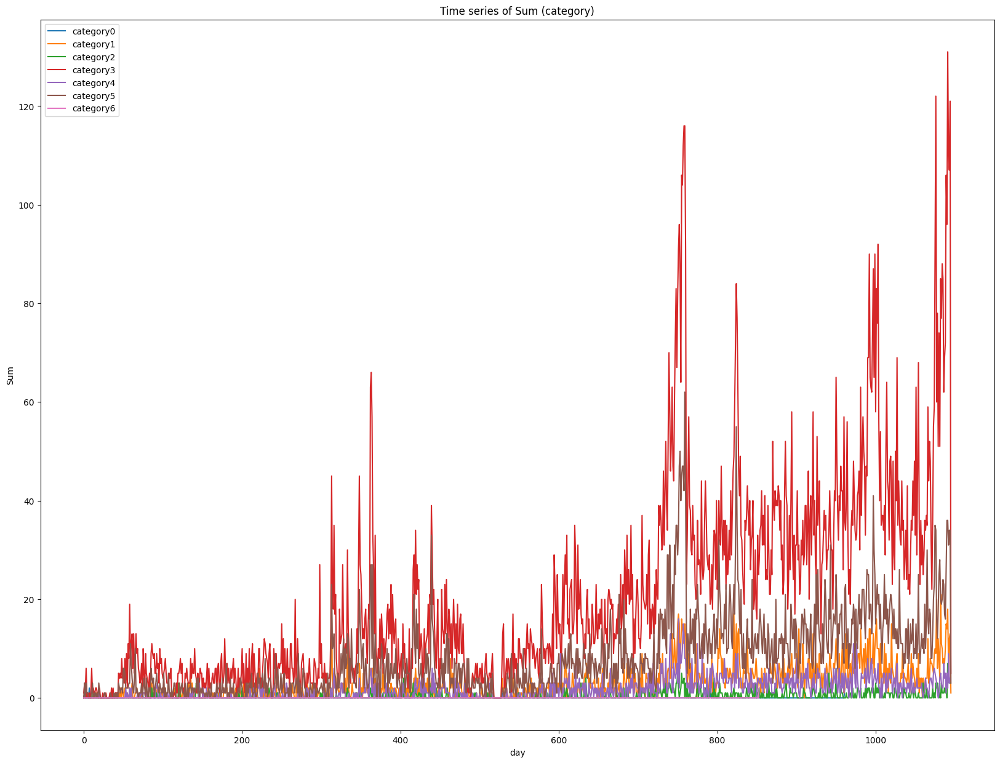

In [28]:
plt.figure(figsize=(20, 15))
plt.plot(category_grouped_df0['day'], category_grouped_df0['Sum'],label='category0')
plt.plot(category_grouped_df1['day'], category_grouped_df1['Sum'],label='category1')
plt.plot(category_grouped_df2['day'], category_grouped_df2['Sum'],label='category2')
plt.plot(category_grouped_df3['day'], category_grouped_df3['Sum'],label='category3')
plt.plot(category_grouped_df4['day'], category_grouped_df4['Sum'],label='category4')
plt.plot(category_grouped_df5['day'], category_grouped_df5['Sum'],label='category5')
plt.plot(category_grouped_df6['day'], category_grouped_df6['Sum'],label='category6')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (category)')
# 凡例の表示
plt.legend()
plt.show()

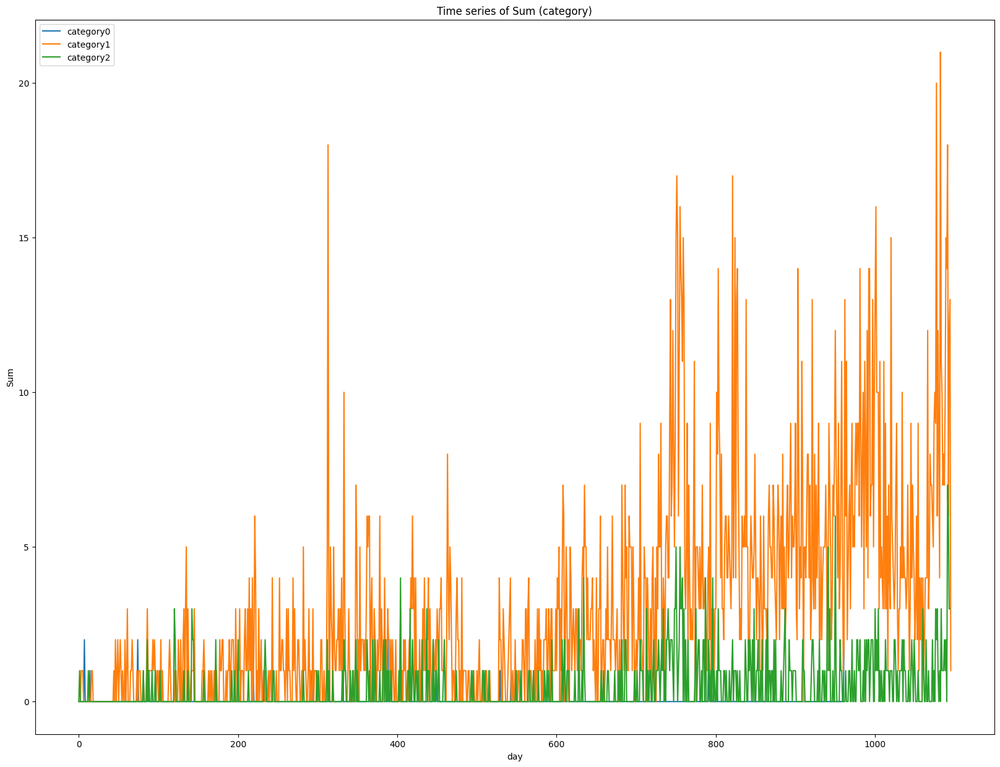

In [29]:
plt.figure(figsize=(20, 15))
plt.plot(category_grouped_df0['day'], category_grouped_df0['Sum'],label='category0')
plt.plot(category_grouped_df1['day'], category_grouped_df1['Sum'],label='category1')
plt.plot(category_grouped_df2['day'], category_grouped_df2['Sum'],label='category2')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (category)')
# 凡例の表示
plt.legend()
plt.show()

In [30]:
import pandas as pd
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import OneHotEncoder



In [31]:
import numpy as np
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import OneHotEncoder
from sklearn.cluster import KMeans
import pandas as pd



In [32]:
#SVDとKMEANSでクラスタリング
# SVD
df2_time_exp=df2.copy()
df2_time_exp_1=df2_time_exp.drop(columns="Orderdatetime")
print(df2_time_exp_1)
svd = TruncatedSVD(n_components=3)
df2_svd = svd.fit_transform(df2_time_exp_1)
df2_svd

       Categoryalias  BrandID  PriceinUSD  jewelrykind
0                  3        0          22            8
2                  5        1           2           23
3                  5        0           3            8
4                  4        0          16            2
6                  3        0           6            8
...              ...      ...         ...          ...
95879              3        0          16            8
95900              3        1          32            8
95908              3        1          25            8
95904              3        0          12            2
95909              3        0           3           11

[58676 rows x 4 columns]


array([[ 23.59467742,   0.20461069,  -0.19122034],
       [ 10.49229602, -21.1750728 ,   0.69578515],
       [  6.17383767,  -7.19193908,  -2.79729022],
       ...,
       [ 26.40207047,   1.27555748,  -0.16980717],
       [ 12.20863485,   1.96643235,  -1.99121093],
       [  6.98090605,  -9.48970125,  -0.14224375]])

In [33]:
kmeans = KMeans(n_clusters=6)  # クラスタの数を設定、ここでは例として3とした
labels = kmeans.fit_predict(df2_svd)
labels

array([1, 0, 3, ..., 1, 3, 3], dtype=int32)

In [34]:
df2_svd_com3 = df2.copy()
df2_svd_com3["label"]=labels
df2_svd_com3

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,label
0,0,3,0,22,8,1
2,26,5,1,2,23,0
3,30,5,0,3,8,3
4,34,4,0,16,2,3
6,34,3,0,6,8,3
...,...,...,...,...,...,...
95879,26301,3,0,16,8,3
95900,26301,3,1,32,8,1
95908,26302,3,1,25,8,1
95904,26302,3,0,12,2,3


In [35]:
show_group(df2_svd_com3,"label")

Cluster 1:
[0, 22, 43, 81, 86, 118, 131, 169, 198, 200, 201, 212, 222, 221, 224, 243, 249, 270, 271, 277, 284, 285, 286, 287, 288, 296, 297, 298, 304, 305, 317, 318, 322, 334, 353, 372, 373, 380, 402, 417, 430, 434, 466, 503, 504, 513, 527, 530, 546, 550, 584, 585, 586, 616, 619, 627, 642, 651, 658, 664, 669, 680, 685, 697, 707, 723, 728, 732, 733, 749, 750, 756, 755, 760, 761, 768, 772, 806, 818, 829, 830, 835, 844, 854, 889, 893, 925, 931, 933, 953, 957, 958, 959, 967, 986, 1024, 1049, 1047, 1052, 1070, 1071, 1074, 1080, 1082, 1088, 1091, 1109, 1110, 1111, 1122, 1125, 1128, 1136, 1140, 1151, 1176, 1183, 1190, 1198, 1203, 1205, 1213, 1220, 1238, 1261, 1300, 1320, 1333, 1337, 1346, 1351, 1381, 1382, 1393, 1392, 1399, 1409, 1410, 1417, 1444, 1452, 1457, 1456, 1471, 1500, 1508, 1509, 1516, 1532, 1535, 1537, 1543, 1594, 1595, 1597, 1600, 1621, 1639, 1641, 1642, 1645, 1670, 1691, 1702, 1700, 1699, 1701, 1706, 1707, 1708, 1711, 1714, 1731, 1734, 1747, 1751, 1763, 1793, 1786, 1789, 1788, 181

In [36]:
df2_svd_com3_df0=df2_svd_com3[df2_svd_com3['label'] == 0]
df2_svd_com3_df1=df2_svd_com3[df2_svd_com3['label'] == 1]
df2_svd_com3_df2=df2_svd_com3[df2_svd_com3['label'] == 2]
df2_svd_com3_df3=df2_svd_com3[df2_svd_com3['label'] == 3]
df2_svd_com3_df4=df2_svd_com3[df2_svd_com3['label'] == 4]
df2_svd_com3_df5=df2_svd_com3[df2_svd_com3['label'] == 5]

In [37]:
df2_svd_com3_df2

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,label
18,77,3,0,86,27,2
128,842,3,0,86,27,2
145,989,3,0,86,27,2
263,1171,3,0,86,27,2
365,1253,3,1,110,14,2
...,...,...,...,...,...,...
95535,26283,6,1,90,8,2
95587,26284,6,1,115,2,2
95645,26286,3,1,91,27,2
95643,26286,3,1,91,27,2


In [38]:
df2_svd_com3_df0=plt_day_of_year(df2_svd_com3_df0)
df2_svd_com3_df1=plt_day_of_year(df2_svd_com3_df1)
df2_svd_com3_df2=plt_day_of_year(df2_svd_com3_df2)
df2_svd_com3_df3=plt_day_of_year(df2_svd_com3_df3)
df2_svd_com3_df4=plt_day_of_year(df2_svd_com3_df4)
df2_svd_com3_df5=plt_day_of_year(df2_svd_com3_df5)
df2_svd_com3_df0

,day,Sum
0,0,0.0
1,1,2.0
2,2,1.0
3,3,2.0
4,4,1.0
...,...,...
1091,1091,50.0
1092,1092,43.0
1093,1093,48.0
1094,1094,31.0


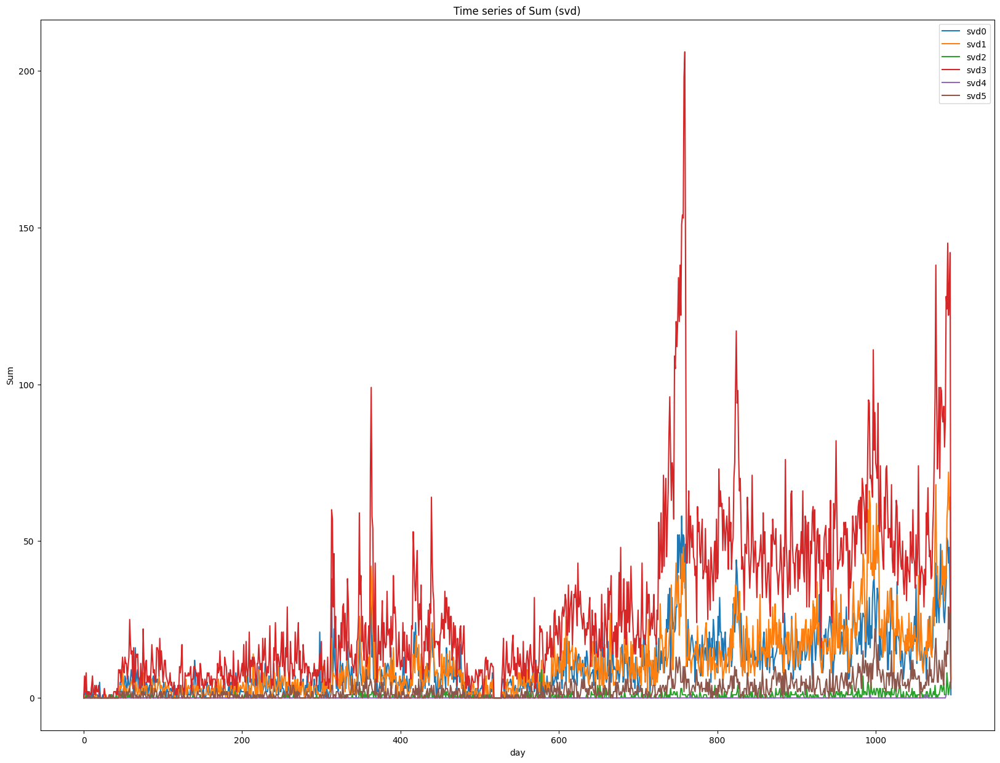

In [39]:
plt.figure(figsize=(20, 15))
plt.plot(df2_svd_com3_df0['day'], df2_svd_com3_df0['Sum'],label='svd0')
plt.plot(df2_svd_com3_df1['day'], df2_svd_com3_df1['Sum'],label='svd1')
plt.plot(df2_svd_com3_df2['day'], df2_svd_com3_df2['Sum'],label='svd2')
plt.plot(df2_svd_com3_df3['day'], df2_svd_com3_df3['Sum'],label='svd3')
plt.plot(df2_svd_com3_df4['day'], df2_svd_com3_df4['Sum'],label='svd4')
plt.plot(df2_svd_com3_df5['day'], df2_svd_com3_df5['Sum'],label='svd5')

plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (svd)')
# 凡例の表示
plt.legend()
plt.show()

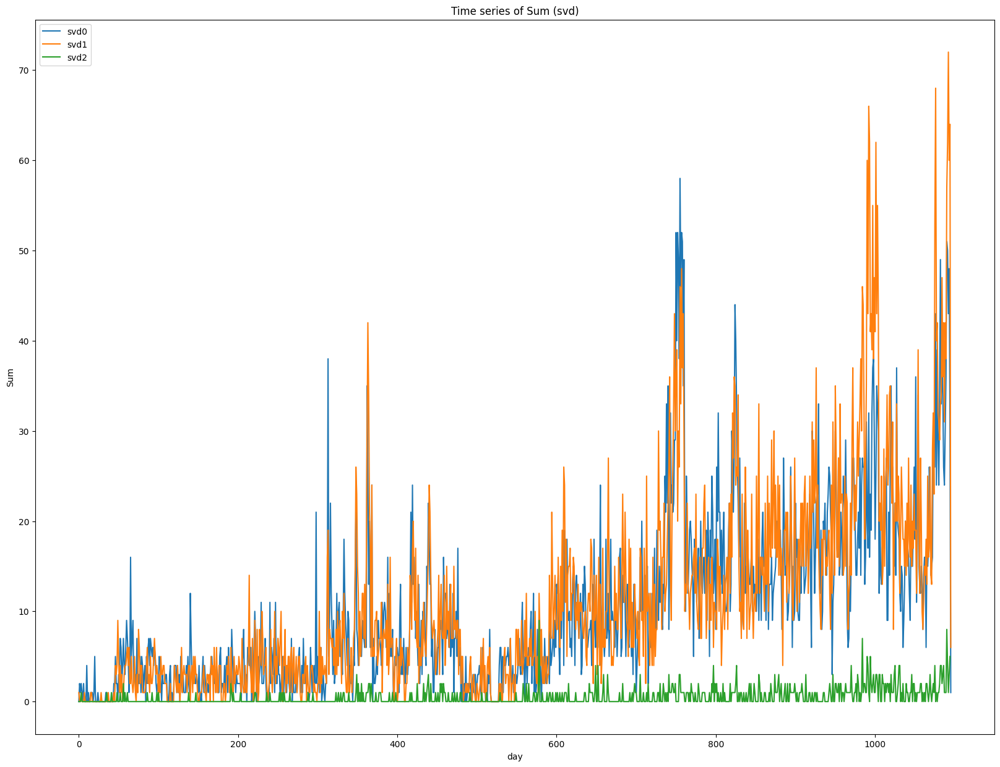

In [40]:
plt.figure(figsize=(20, 15))
plt.plot(df2_svd_com3_df0['day'], df2_svd_com3_df0['Sum'],label='svd0')
plt.plot(df2_svd_com3_df1['day'], df2_svd_com3_df1['Sum'],label='svd1')
plt.plot(df2_svd_com3_df2['day'], df2_svd_com3_df2['Sum'],label='svd2')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (svd)')
# 凡例の表示
plt.legend()
plt.show()

In [41]:
# MDSで次元削減
from sklearn.manifold import MDS
#mds = MDS(n_components=3)
#labels= mds.fit_transform(df2_svd)
#labels

In [42]:
from sklearn.decomposition import PCA
# PCAによる次元削減
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(df2_time_exp_1)
# KMeansによるクラスタリング
kmeans = KMeans(n_clusters=6)
labels = kmeans.fit_predict(reduced_data)
df2_pca_com3 = df2.copy()
df2_pca_com3["label"]=labels
df2_pca_com3

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,label
0,0,3,0,22,8,1
2,26,5,1,2,23,0
3,30,5,0,3,8,4
4,34,4,0,16,2,4
6,34,3,0,6,8,4
...,...,...,...,...,...,...
95879,26301,3,0,16,8,4
95900,26301,3,1,32,8,1
95908,26302,3,1,25,8,1
95904,26302,3,0,12,2,4


In [43]:
show_group(df2_pca_com3,"label")

Cluster 1:
[0, 22, 43, 81, 86, 118, 131, 169, 198, 200, 201, 212, 222, 221, 224, 243, 249, 270, 271, 277, 284, 285, 286, 287, 288, 296, 297, 298, 304, 305, 317, 318, 322, 334, 353, 372, 373, 380, 402, 417, 430, 434, 466, 503, 504, 513, 527, 530, 546, 550, 584, 585, 586, 616, 619, 627, 642, 651, 658, 664, 669, 680, 685, 697, 707, 723, 728, 732, 733, 749, 750, 756, 755, 760, 761, 768, 772, 806, 818, 829, 830, 835, 844, 854, 889, 893, 925, 931, 933, 953, 957, 958, 959, 967, 986, 1024, 1049, 1047, 1052, 1070, 1071, 1074, 1080, 1082, 1088, 1091, 1109, 1110, 1111, 1122, 1125, 1128, 1136, 1140, 1151, 1176, 1183, 1190, 1198, 1203, 1205, 1213, 1220, 1238, 1261, 1300, 1320, 1333, 1337, 1346, 1351, 1381, 1382, 1393, 1392, 1399, 1409, 1410, 1417, 1444, 1452, 1457, 1456, 1471, 1500, 1508, 1509, 1516, 1532, 1535, 1537, 1543, 1594, 1595, 1597, 1600, 1621, 1639, 1641, 1642, 1645, 1670, 1691, 1702, 1700, 1699, 1701, 1706, 1707, 1708, 1711, 1714, 1731, 1734, 1747, 1751, 1763, 1793, 1786, 1789, 1788, 181

In [44]:
df2_pca_com3_df0=df2_pca_com3[df2_pca_com3['label'] == 0]
df2_pca_com3_df1=df2_pca_com3[df2_pca_com3['label'] == 1]
df2_pca_com3_df2=df2_pca_com3[df2_pca_com3['label'] == 2]
df2_pca_com3_df3=df2_pca_com3[df2_pca_com3['label'] == 3]
df2_pca_com3_df4=df2_pca_com3[df2_pca_com3['label'] == 4]
df2_pca_com3_df5=df2_pca_com3[df2_pca_com3['label'] == 5]

In [45]:
df2_pca_com3_df0=plt_day_of_year(df2_pca_com3_df0)
df2_pca_com3_df1=plt_day_of_year(df2_pca_com3_df1)
df2_pca_com3_df2=plt_day_of_year(df2_pca_com3_df2)
df2_pca_com3_df3=plt_day_of_year(df2_pca_com3_df3)
df2_pca_com3_df4=plt_day_of_year(df2_pca_com3_df4)
df2_pca_com3_df5=plt_day_of_year(df2_pca_com3_df5)
df2_pca_com3_df0

,day,Sum
0,0,0.0
1,1,2.0
2,2,1.0
3,3,2.0
4,4,1.0
...,...,...
1091,1091,50.0
1092,1092,43.0
1093,1093,48.0
1094,1094,31.0


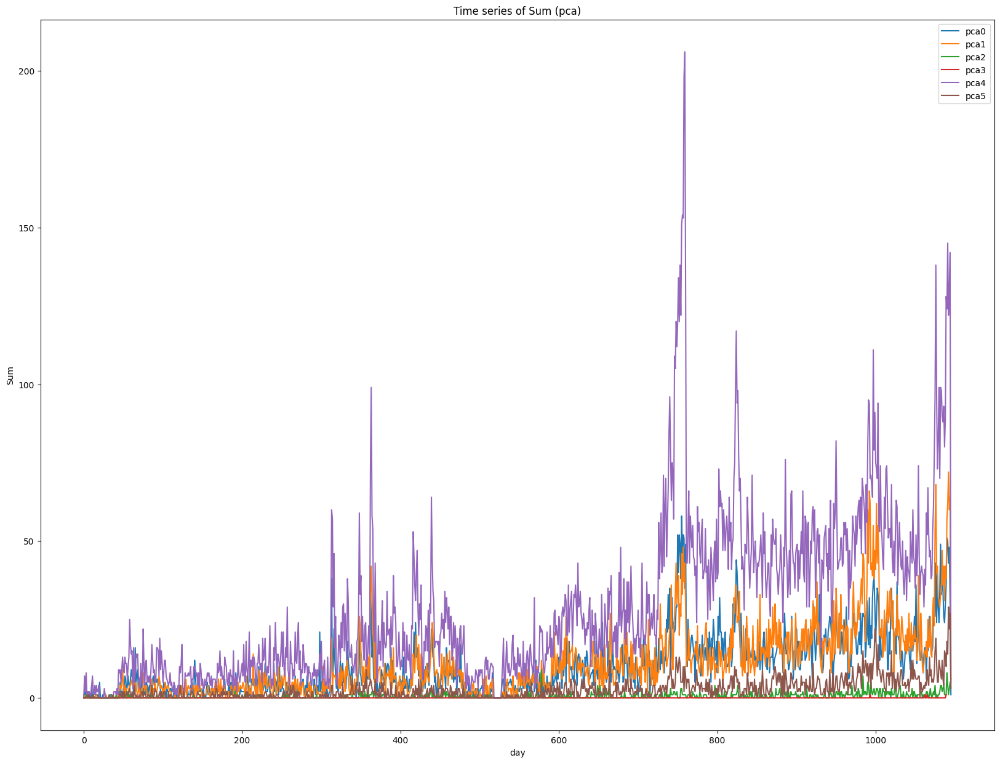

In [46]:
plt.figure(figsize=(20, 15))
plt.plot(df2_pca_com3_df0['day'], df2_pca_com3_df0['Sum'],label='pca0')
plt.plot(df2_pca_com3_df1['day'], df2_pca_com3_df1['Sum'],label='pca1')
plt.plot(df2_pca_com3_df2['day'], df2_pca_com3_df2['Sum'],label='pca2')
plt.plot(df2_pca_com3_df3['day'], df2_pca_com3_df3['Sum'],label='pca3')
plt.plot(df2_pca_com3_df4['day'], df2_pca_com3_df4['Sum'],label='pca4')
plt.plot(df2_pca_com3_df5['day'], df2_pca_com3_df5['Sum'],label='pca5')

plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (pca)')
# 凡例の表示
plt.legend()
plt.show()

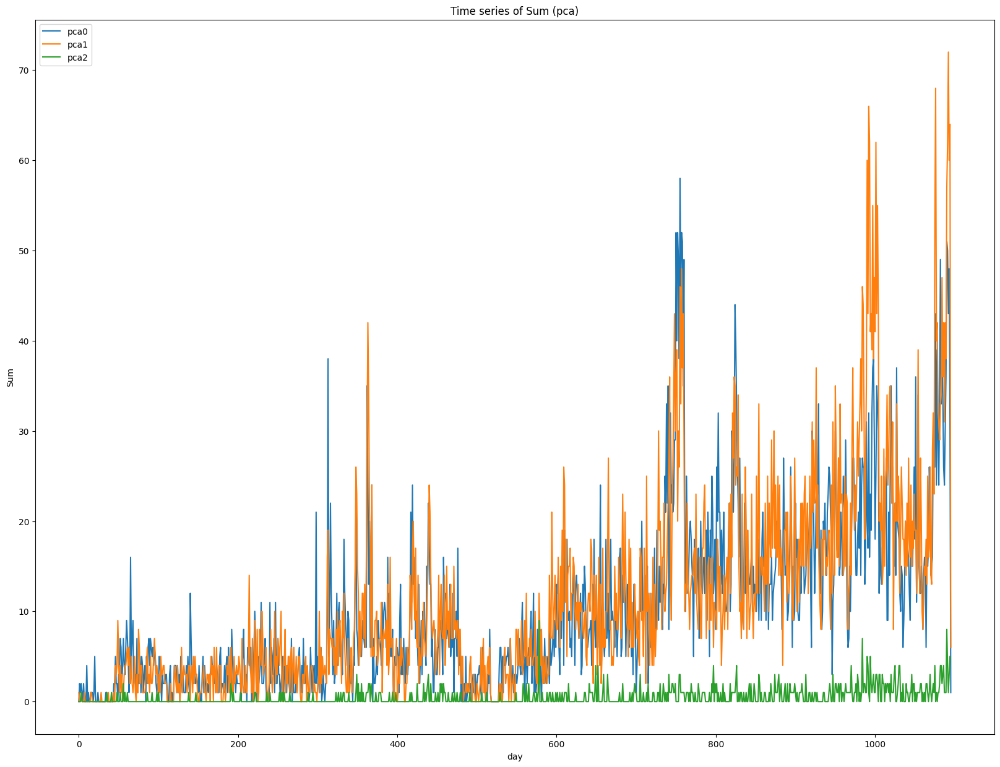

In [47]:
plt.figure(figsize=(20, 15))
plt.plot(df2_pca_com3_df0['day'], df2_pca_com3_df0['Sum'],label='pca0')
plt.plot(df2_pca_com3_df1['day'], df2_pca_com3_df1['Sum'],label='pca1')
plt.plot(df2_pca_com3_df2['day'], df2_pca_com3_df2['Sum'],label='pca2')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (pca)')
# 凡例の表示
plt.legend()
plt.show()

In [48]:
from sklearn.manifold import TSNE
# t-SNEによる次元削減
tsne = TSNE(n_components=3)
reduced_data = tsne.fit_transform(df2_time_exp_1) 


/Users/katoutsubasa/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/Users/katoutsubasa/anaconda3/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [49]:
# KMeansによるクラスタリング
kmeans = KMeans(n_clusters=6)
labels = kmeans.fit_predict(reduced_data)
df2_sne_com3 = df2.copy()
df2_sne_com3["label"]=labels
df2_sne_com3

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,label
0,0,3,0,22,8,3
2,26,5,1,2,23,0
3,30,5,0,3,8,5
4,34,4,0,16,2,0
6,34,3,0,6,8,4
...,...,...,...,...,...,...
95879,26301,3,0,16,8,4
95900,26301,3,1,32,8,2
95908,26302,3,1,25,8,3
95904,26302,3,0,12,2,1


In [50]:
show_group(df2_sne_com3,"label")

Cluster 3:
[0, 18, 77, 80, 81, 85, 86, 89, 96, 98, 112, 122, 128, 131, 134, 145, 154, 165, 171, 186, 205, 204, 218, 225, 242, 243, 259, 262, 263, 283, 305, 316, 335, 340, 343, 347, 365, 374, 390, 438, 464, 479, 483, 484, 492, 508, 509, 514, 520, 532, 531, 530, 536, 565, 567, 572, 570, 577, 606, 607, 617, 667, 675, 678, 682, 686, 685, 714, 726, 749, 756, 771, 777, 779, 810, 815, 820, 829, 888, 892, 901, 903, 916, 917, 919, 931, 938, 954, 955, 967, 969, 988, 997, 999, 1018, 1028, 1040, 1049, 1047, 1054, 1059, 1060, 1072, 1073, 1083, 1089, 1090, 1100, 1122, 1123, 1125, 1135, 1130, 1157, 1176, 1182, 1214, 1243, 1248, 1291, 1312, 1317, 1331, 1343, 1352, 1371, 1376, 1373, 1381, 1393, 1390, 1415, 1429, 1435, 1440, 1443, 1447, 1460, 1457, 1476, 1488, 1513, 1521, 1530, 1550, 1559, 1573, 1576, 1596, 1599, 1611, 1616, 1645, 1647, 1654, 1702, 1701, 1712, 1715, 1747, 1748, 1767, 1784, 1792, 1803, 1812, 1821, 1844, 1845, 1851, 1874, 1875, 1878, 1888, 1898, 1916, 1921, 1924, 1936, 1940, 1943, 1951, 2

In [51]:
df2_sne_com3_df0=df2_sne_com3[df2_sne_com3['label'] == 0]
df2_sne_com3_df1=df2_sne_com3[df2_sne_com3['label'] == 1]
df2_sne_com3_df2=df2_sne_com3[df2_sne_com3['label'] == 2]
df2_sne_com3_df3=df2_sne_com3[df2_sne_com3['label'] == 3]
df2_sne_com3_df4=df2_sne_com3[df2_sne_com3['label'] == 4]
df2_sne_com3_df5=df2_sne_com3[df2_sne_com3['label'] == 5]
df2_sne_com3_df0=plt_day_of_year(df2_sne_com3_df0)
df2_sne_com3_df1=plt_day_of_year(df2_sne_com3_df1)
df2_sne_com3_df2=plt_day_of_year(df2_sne_com3_df2)
df2_sne_com3_df3=plt_day_of_year(df2_sne_com3_df3)
df2_sne_com3_df4=plt_day_of_year(df2_sne_com3_df4)
df2_sne_com3_df5=plt_day_of_year(df2_sne_com3_df5)

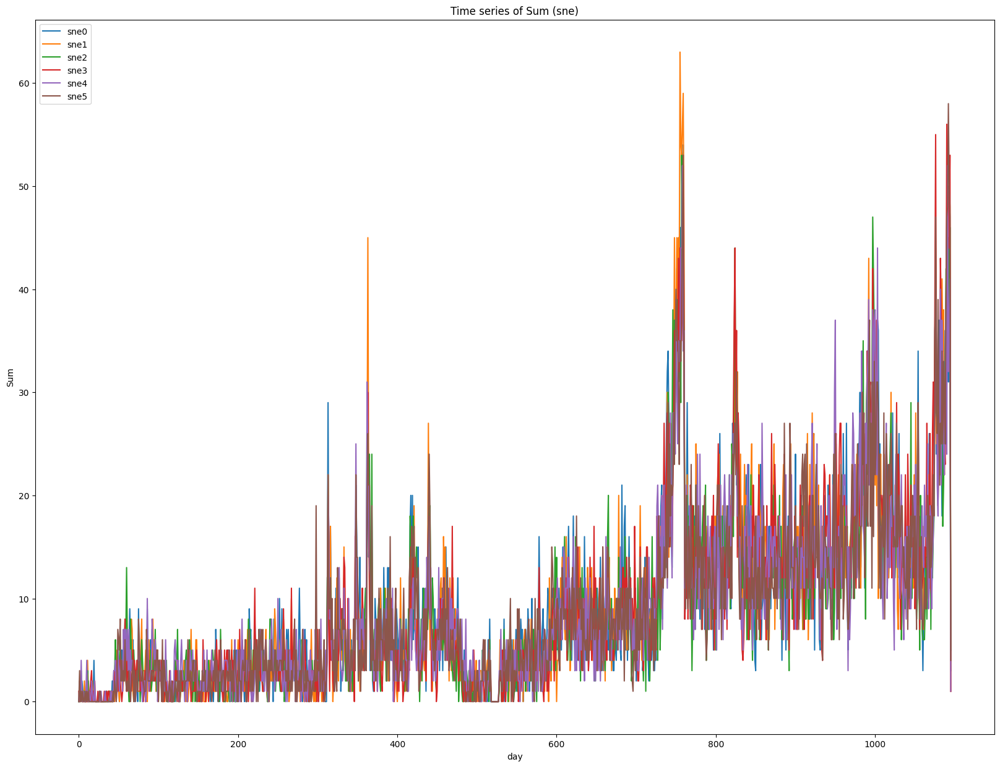

In [52]:
plt.figure(figsize=(20, 15))
plt.plot(df2_sne_com3_df0['day'], df2_sne_com3_df0['Sum'],label='sne0')
plt.plot(df2_sne_com3_df1['day'], df2_sne_com3_df1['Sum'],label='sne1')
plt.plot(df2_sne_com3_df2['day'], df2_sne_com3_df2['Sum'],label='sne2')
plt.plot(df2_sne_com3_df3['day'], df2_sne_com3_df3['Sum'],label='sne3')
plt.plot(df2_sne_com3_df4['day'], df2_sne_com3_df4['Sum'],label='sne4')
plt.plot(df2_sne_com3_df5['day'], df2_sne_com3_df5['Sum'],label='sne5')

plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (sne)')
# 凡例の表示
plt.legend()
plt.show()

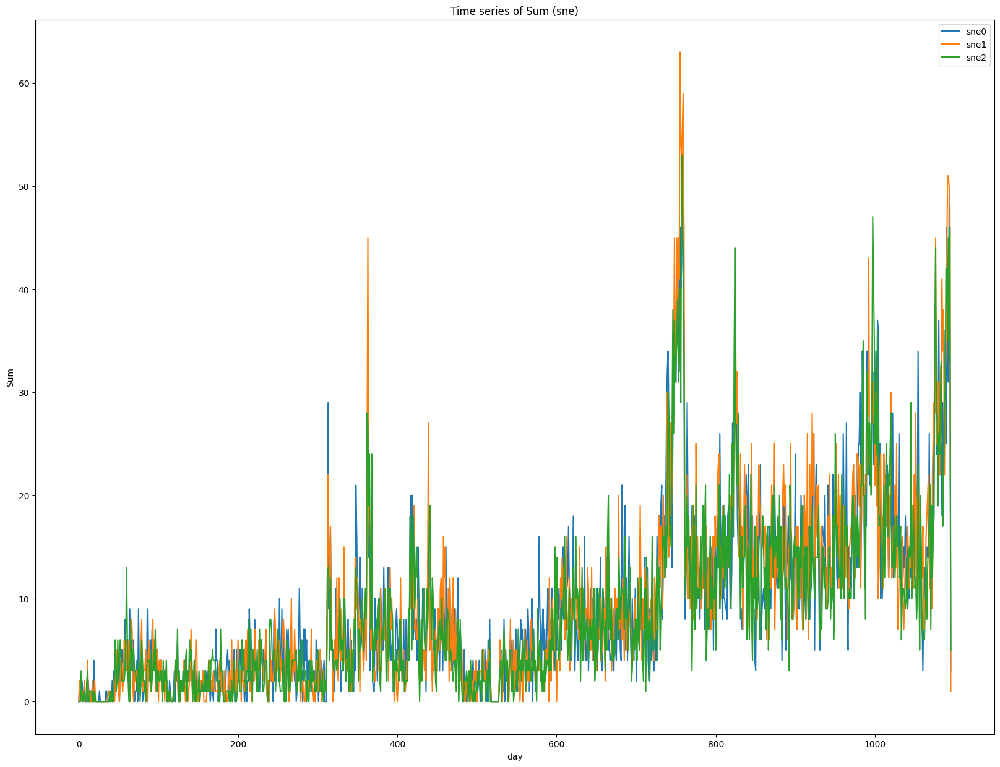

In [53]:
plt.figure(figsize=(20, 15))
plt.plot(df2_sne_com3_df0['day'], df2_sne_com3_df0['Sum'],label='sne0')
plt.plot(df2_sne_com3_df1['day'], df2_sne_com3_df1['Sum'],label='sne1')
plt.plot(df2_sne_com3_df2['day'], df2_sne_com3_df2['Sum'],label='sne2')
plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (sne)')
# 凡例の表示
plt.legend()
plt.show()

In [54]:
#Orderdatetime	Order ID	Purchased product ID	Quantity of SKU in the order	Category ID	Categoryalias	BrandID	PriceinUSD	User ID	Product gender (for male/female)	Unnamed: 10	Unnamed: 11	jewelrykind
        
import gensim
from gensim.corpora import Dictionary
lda_copy=df.copy()
lda_copy["BrandID"]=lda_copy['BrandID'].astype(str)
lda_copy['PriceinUSD'] = np.floor(lda_copy['PriceinUSD'] / 25).astype(int)
lda_copy['PriceinUSD'] = lda_copy['PriceinUSD'].astype(str)
#print(lda_copy)
data_lda=lda_copy[["Categoryalias","BrandID","PriceinUSD","jewelrykind"]].values.tolist()
data_lda

[['jewelry.pendant', '1.0', '2', 'sapphire'],
 ['jewelry.pendant', '0.0', '3', 'diamond'],
 ['jewelry.pendant', '2.0', '2', 'pearl'],
 ['jewelry.earring', '1.0', '4', 'garnet'],
 ['jewelry.pendant', '1.0', '2', 'garnet'],
 ['jewelry.earring', '2.0', '24', 'diamond'],
 ['jewelry.earring', '1.0', '2', 'fianit'],
 ['jewelry.earring', '2.0', '9', 'garnet'],
 ['jewelry.bracelet', '1.0', '5', 'pearl'],
 ['jewelry.bracelet', '1.0', '6', 'fianit'],
 ['jewelry.earring', '1.0', '49', 'diamond'],
 ['jewelry.earring', '1.0', '56', 'diamond'],
 ['jewelry.ring', '1.0', '18', 'diamond'],
 ['jewelry.ring', '1.0', '10', 'diamond'],
 ['jewelry.ring', '1.0', '3', 'fianit'],
 ['jewelry.ring', '2.0', '6', 'ruby'],
 ['jewelry.earring', '1.0', '56', 'diamond'],
 ['jewelry.ring', '1.0', '6', 'garnet'],
 ['jewelry.pendant', '1.0', '9', 'diamond'],
 ['jewelry.earring', '1.0', '25', 'diamond'],
 ['jewelry.ring', '1.0', '7', 'pearl'],
 ['jewelry.earring', '1.0', '8', 'garnet'],
 ['jewelry.ring', '1.0', '4', 'garn

In [55]:
# 辞書とコーパスの作成
import
dictionary = corpora.Dictionary(data_lda)
corpus = [dictionary.doc2bow(text) for text in data_lda]

# LDAモデルの初期化と学習
model = models.LdaModel(corpus=corpus, num_topics=6, id2word=dictionary)

NameError: name 'corpora' is not defined

In [ ]:
label=[]
#new_vec = dictionary.doc2bow(data_lda[0])
#topic_result=model[new_vec]
#max_tuple = max(topic_result, key=lambda x: x[1])
#print(max_tuple[0])
for i in range(len(data_lda)):
    new_vec = dictionary.doc2bow(data_lda[i])
    topic_result=model[new_vec]
    max_tuple = max(topic_result, key=lambda x: x[1])
    label.append(max_tuple[0])

In [ ]:
#print(label)
lda_copy["label"]=label
lda_copy[time_idx]=lda_copy[time_idx].str.replace("UTC","")
lda_copy[time_idx] = pd.to_datetime(lda_copy[time_idx])
lda_copy[time_idx] = lda_copy[time_idx].round(freq)
lda_copy = lda_copy.sort_values(time_idx)
start = lda_copy[time_idx].min()
end = lda_copy[time_idx].max()
ticks = pd.date_range(start, end, freq=freq)
timepoint_encoder = preprocessing.LabelEncoder()
timepoint_encoder.fit(ticks)
lda_copy[time_idx] = timepoint_encoder.transform(lda_copy[time_idx].values)
lda_copy

In [ ]:
show_group(lda_copy,"label")

In [ ]:
lda_copy_df0=lda_copy[lda_copy['label'] == 0]
lda_copy_df1=lda_copy[lda_copy['label'] == 1]
lda_copy_df2=lda_copy[lda_copy['label'] == 2]
lda_copy_df3=lda_copy[lda_copy['label'] == 3]
lda_copy_df4=lda_copy[lda_copy['label'] == 4]
lda_copy_df5=lda_copy[lda_copy['label'] == 5]
print(lda_copy_df0)

In [ ]:
lda_copy_df0=plt_day_of_year(lda_copy_df0)
lda_copy_df1=plt_day_of_year(lda_copy_df1)
lda_copy_df2=plt_day_of_year(lda_copy_df2)
lda_copy_df3=plt_day_of_year(lda_copy_df3)
lda_copy_df4=plt_day_of_year(lda_copy_df4)
lda_copy_df5=plt_day_of_year(lda_copy_df5)

In [ ]:
lda_copy_df0

In [ ]:
plt.figure(figsize=(20, 15))
plt.plot(lda_copy_df0['day'], lda_copy_df0['Sum'],label='lda0')
plt.plot(lda_copy_df1['day'], lda_copy_df1['Sum'],label='lda1')
plt.plot(lda_copy_df2['day'], lda_copy_df2['Sum'],label='lda2')
plt.plot(lda_copy_df3['day'], lda_copy_df3['Sum'],label='lda3')
plt.plot(lda_copy_df4['day'], lda_copy_df4['Sum'],label='lda4')
plt.plot(lda_copy_df5['day'], lda_copy_df5['Sum'],label='lda5')

plt.xlabel('day')
plt.ylabel('Sum')
plt.title('Time series of Sum (lda)')
# 凡例の表示
plt.legend()
plt.show()

In [ ]:
#!pip install threadpoolctl==3.1.0
#!pip install scikit-learn==1.1.3
#!pip install numpy==1.21.4
#!pip install threadpoolctl -U
#from sklearn.cluster import KMeans
#reduced_data=np.array([[1,2],[3,4],[5,6],[7,8]])
#kmeans = KMeans(n_clusters=3)  # クラスタの数を設定、ここでは例として3とした
#labels = kmeans.fit_predict(reduced_data)

In [ ]:
import gensim
from gensim.corpora import Dictionary

# データの例。各レコードは「Categoryalias」と「jewelrykind」を結合したものとします。
data_t = [
  ['jewelry.earring', 'diamond'],
  ['jewelry.pendant', 'sapphire'],
  ['jewelry.pendant', 'diamond'],
  ['jewelry.necklace', 'amethyst'],
  ['jewelry.earring', 'diamond'],
]

# gensimの辞書オブジェクトを作成
dictionary = Dictionary(data_t)
print(dictionary)
# 各レコードをBoW形式に変換
corpus = [dictionary.doc2bow(record) for record in data_t]
print(corpus)

In [ ]:
import sklearn
sklearn.show_versions()

In [56]:
df2["UserID"]=df["User ID"]
df2_tensor=df2.copy()
df2_tensor=df2_tensor.dropna()
df2_tensor

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,UserID
2,26,5,1,2,23,1.515916e+18
3,30,5,0,3,8,1.515916e+18
8,43,5,2,2,18,1.515916e+18
19,80,3,1,4,12,1.515916e+18
20,80,5,1,2,12,1.515916e+18
...,...,...,...,...,...,...
95873,26301,3,1,17,12,1.515916e+18
95872,26301,6,1,11,8,1.515916e+18
95897,26301,5,1,3,11,1.515916e+18
95900,26301,3,1,32,8,1.515916e+18


In [57]:
# Encode categorical features
categorical_idxs="UserID"
categorical_idxs = categorical_idxs.split("/")
oe = preprocessing.OrdinalEncoder()
df2_tensor[categorical_idxs] = oe.fit_transform(df2_tensor[categorical_idxs])
df2_tensor[categorical_idxs] = df2_tensor[categorical_idxs].astype(int)
# カテゴリごとのエンコード結果を表示
for i, column in enumerate(categorical_idxs):
    print(f'Column: {column}') 
    for category, encoded in zip(oe.categories_[i], range(len(oe.categories_[i]))):
        print(f'{category} -> {encoded}')
df2_tensor

Column: UserID
1.3135555415863468e+18 -> 0
1.313565915903689e+18 -> 1
1.313582215799505e+18 -> 2
1.3135910334428618e+18 -> 3
1.3136054893297016e+18 -> 4
1.3136343076794537e+18 -> 5
1.3136581648889946e+18 -> 6
1.3136894357741245e+18 -> 7
1.3137147436927557e+18 -> 8
1.313724432660825e+18 -> 9
1.3137533189163592e+18 -> 10
1.3138096378326548e+18 -> 11
1.313835407502214e+18 -> 12
1.3138388921970854e+18 -> 13
1.3138667427028014e+18 -> 14
1.313900572918678e+18 -> 15
1.313904969698509e+18 -> 16
1.3139377873255142e+18 -> 17
1.3139583308167905e+18 -> 18
1.3139873704748e+18 -> 19
1.3141089448424899e+18 -> 20
1.314259286137767e+18 -> 21
1.314441171619021e+18 -> 22
1.3146371012658468e+18 -> 23
1.3146716590928046e+18 -> 24
1.3150467995132242e+18 -> 25
1.3150806342002278e+18 -> 26
1.3151155344417756e+18 -> 27
1.315125833655911e+18 -> 28
1.3152126603959995e+18 -> 29
1.3152513970415862e+18 -> 30
1.3152523323042696e+18 -> 31
1.3159031621791263e+18 -> 32
1.3160390585346957e+18 -> 33
1.3168203057709716e+1

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,UserID
2,26,5,1,2,23,266
3,30,5,0,3,8,1253
8,43,5,2,2,18,1564
19,80,3,1,4,12,1451
20,80,5,1,2,12,1451
...,...,...,...,...,...,...
95873,26301,3,1,17,12,11451
95872,26301,6,1,11,8,450
95897,26301,5,1,3,11,14283
95900,26301,3,1,32,8,14163


In [58]:
import numpy as np
import pandas as pd
!pip install tensorly
import tensorly as tl
from tensorly.decomposition import non_negative_parafac


In [59]:
df2_tensor_copy=df2_tensor.copy()
df2_tensor_copy = df2_tensor_copy[df2_tensor_copy['Orderdatetime'] <= 8760*3]
df2_tensor_copy

,Orderdatetime,Categoryalias,BrandID,PriceinUSD,jewelrykind,UserID
2,26,5,1,2,23,266
3,30,5,0,3,8,1253
8,43,5,2,2,18,1564
19,80,3,1,4,12,1451
20,80,5,1,2,12,1451
...,...,...,...,...,...,...
95407,26280,3,2,4,8,7643
95396,26280,3,1,32,8,1531
95395,26280,6,1,18,8,1531
95394,26280,5,1,6,27,260


In [60]:
# 3つのフィールドを選択
fields = ['Orderdatetime', 'jewelrykind', 'UserID']
from sklearn.preprocessing import LabelEncoder

# 各フィールドをエンコード
encoders = {}
for field in fields:
    le = LabelEncoder()
    df2_tensor_copy[field] = le.fit_transform(df2_tensor_copy[field])
    encoders[field] = le

# テンソルの次元を定義
shape = [len(encoders[field].classes_) for field in fields]

# 頻度テンソルを初期化
tensor = np.zeros(shape)

# テンソルに値を追加
for _, row in df2_tensor_copy.iterrows():
    index = [row[field] for field in fields]
    tensor[tuple(index)] += 1

In [61]:
tensor

array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

In [ ]:
df_filtered_0 = order_counts[order_counts['Orderdatetime'] <= 8760*3]

In [62]:
# 非負値テンソル分解
factors = non_negative_parafac(tensor, rank=5)

print(factors)

LinAlgError: SVD did not converge